In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2

from sklearn.neighbors import NearestNeighbors

In [2]:
IM_FOLDER = '../data/train/images'
TRAIN_MASK = '../data/masks/'
PUBLIC_MASK = '../data/masks_public/'
PUBLIC_IM_FOLDER = '../data/public_test/images/'

In [3]:
train_df = pd.read_csv('../data/train_resolve_duplicates.csv')
test_df = pd.read_csv('../data/public_test/public_test_meta.csv')

In [4]:
train_df

,image_id,fname,mask,distancing,5k
0,1,1.jpg,1.0,1.0,1.0
1,2,2.jpg,0.0,NaN,NaN
2,3,3.jpg,1.0,1.0,1.0
3,4,4.jpg,1.0,1.0,1.0
4,5,5.jpg,0.0,0.0,0.0
...,...,...,...,...,...
3944,4171,4171.jpg,0.0,1.0,0.0
3945,4172,4172.jpg,1.0,1.0,1.0
3946,4173,4173.jpg,1.0,NaN,NaN
3947,4174,4174.jpg,1.0,1.0,1.0


In [5]:
def read_and_show(path, label, show_mask=True):
    im = plt.imread(path)
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(im)
    plt.title(str(label.tolist()))
    
    if(show_mask):
        masks = np.load(TRAIN_MASK + '/' + str(ex.image_id) + '.npy')
        mask2d = np.zeros(shape=masks.shape[1:])
        step = int(255 / masks.shape[0]) if masks.shape[0] != 0 else 0
        color = step
        for m in masks:
            color = np.clip(color, 0, 255)
            mask2d[m>0] = color
            color += step
        plt.subplot(1,2,2)
        plt.imshow(mask2d)

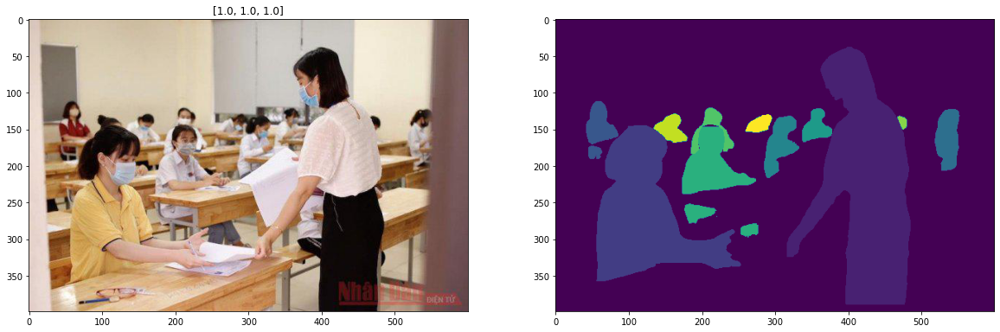

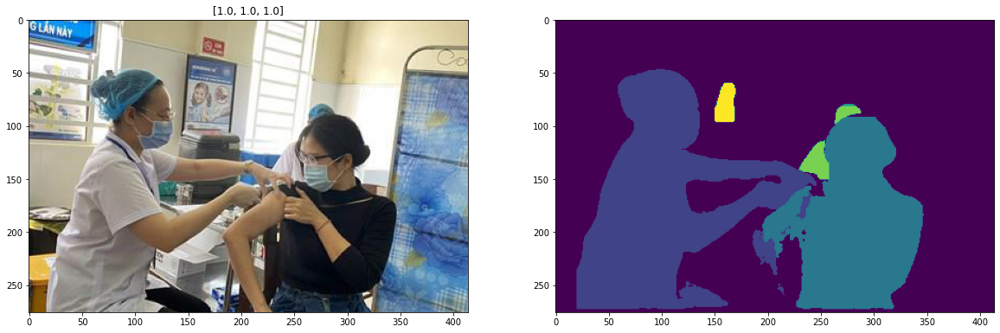

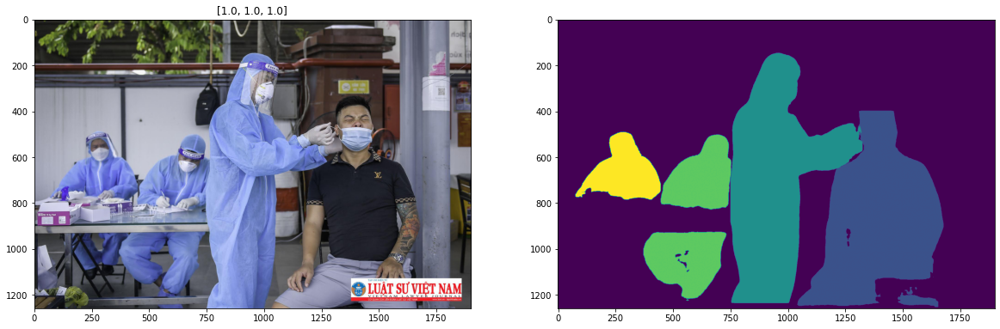

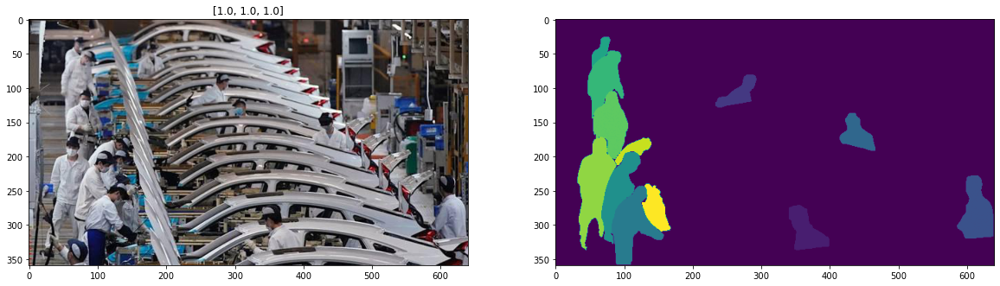

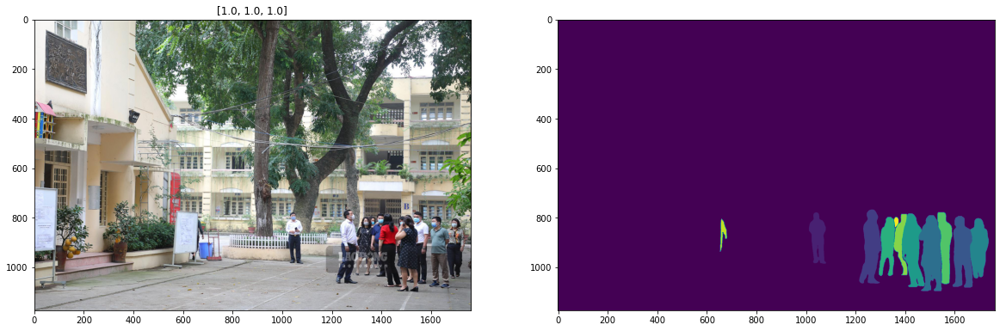

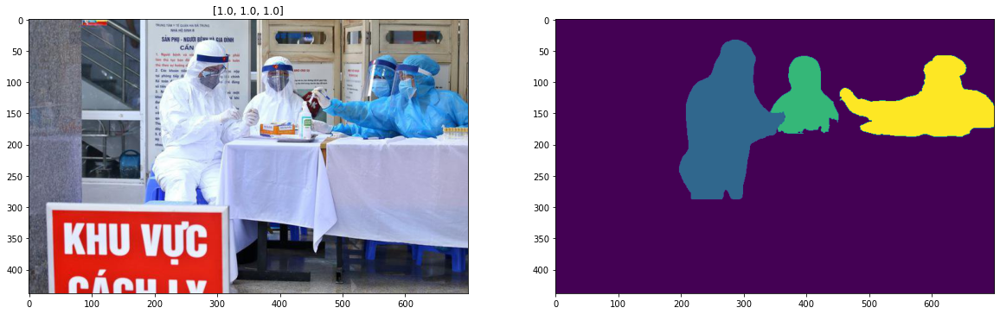

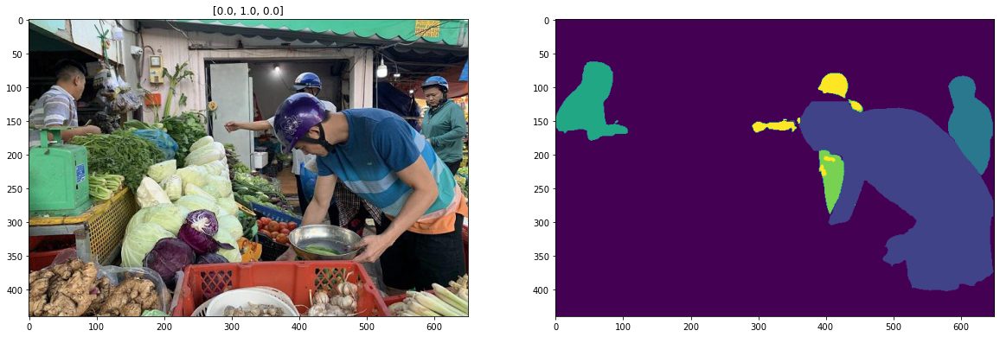

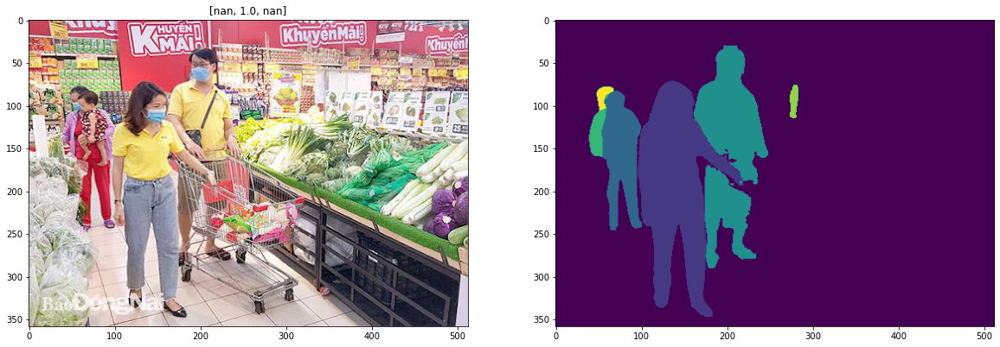

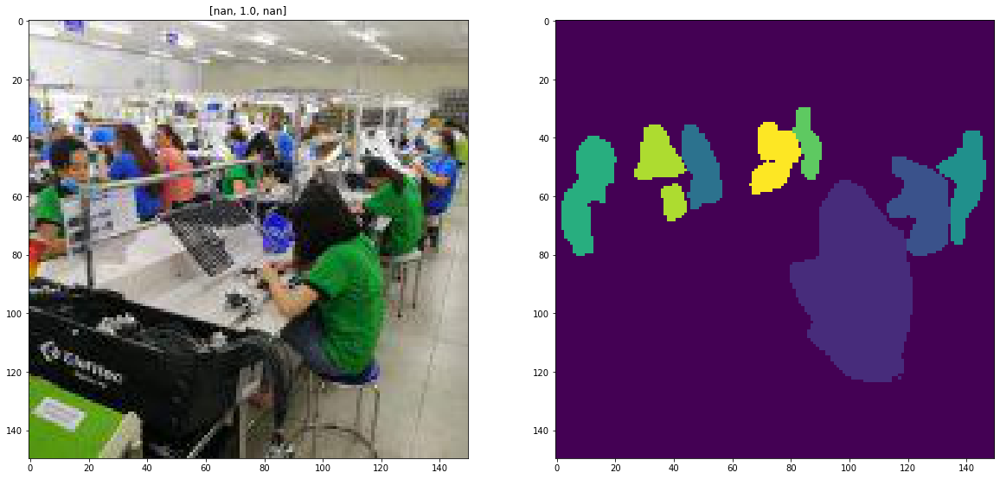

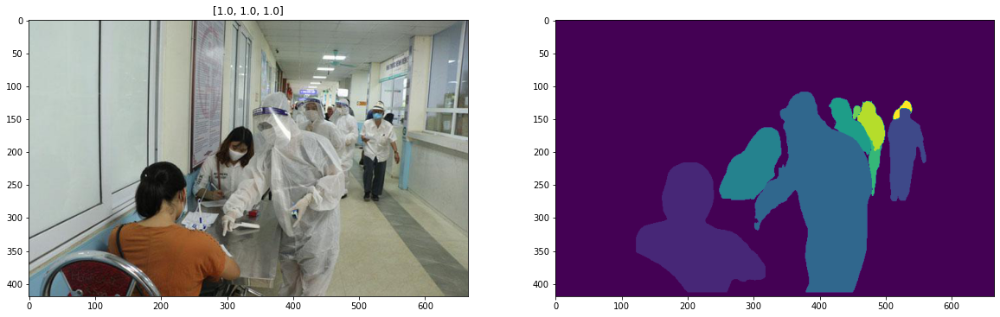

In [6]:
for i in range(10):
    ex = train_df[train_df['distancing']==1].sample(1).iloc[0]
    path = os.path.join(IM_FOLDER, ex.fname)
    read_and_show(path, ex[['mask', 'distancing', '5k']])

In [7]:
from tqdm.notebook import tqdm

In [8]:
for i in tqdm(range(len(train_df))):
    ex = train_df.iloc[i]
    masks = np.load(TRAIN_MASK + '/' + str(ex.image_id) + '.npy')
    train_df.loc[i, 'n_people'] = masks.shape[0]


  0%|          | 0/3949 [00:00<?, ?it/s]

In [9]:
for i in tqdm(range(len(test_df))):
    ex = test_df.iloc[i]
    masks = np.load(PUBLIC_MASK + '/' + str(ex.image_id) + '.npy')
    test_df.loc[i, 'n_people'] = masks.shape[0]


  0%|          | 0/542 [00:00<?, ?it/s]

In [10]:
test_df

,image_id,fname,n_people
0,1,1.jpg,21.0
1,2,2.jpg,8.0
2,3,3.jpg,7.0
3,4,4.jpg,1.0
4,5,5.jpg,14.0
...,...,...,...
537,538,538.jpg,9.0
538,539,539.jpg,7.0
539,540,540.jpg,17.0
540,541,541.jpg,14.0


In [11]:
# train_df['distancing'] = train_df['distancing'].fillna(0)

In [12]:
train_df[['distancing', 'n_people']].corr()

,distancing,n_people
distancing,1.000000,-0.369248
n_people,-0.369248,1.000000


### Check images with distancing=0 but n_people ==1

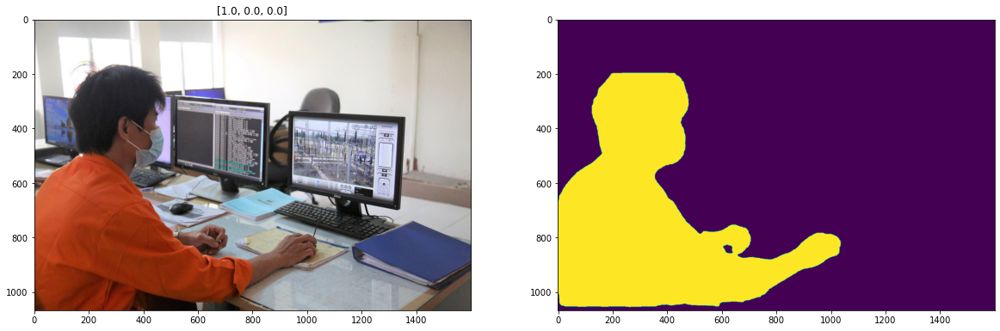

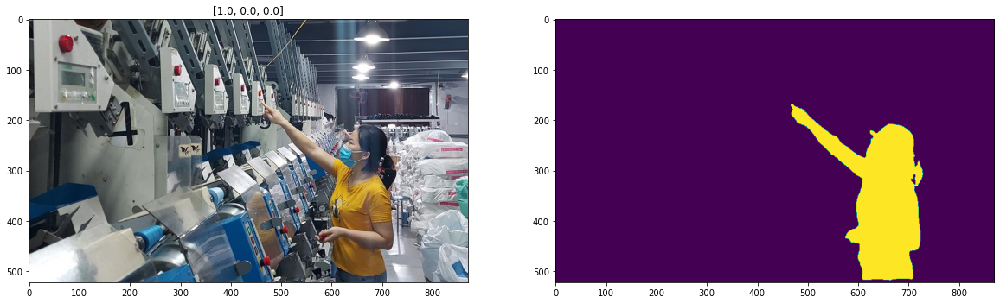

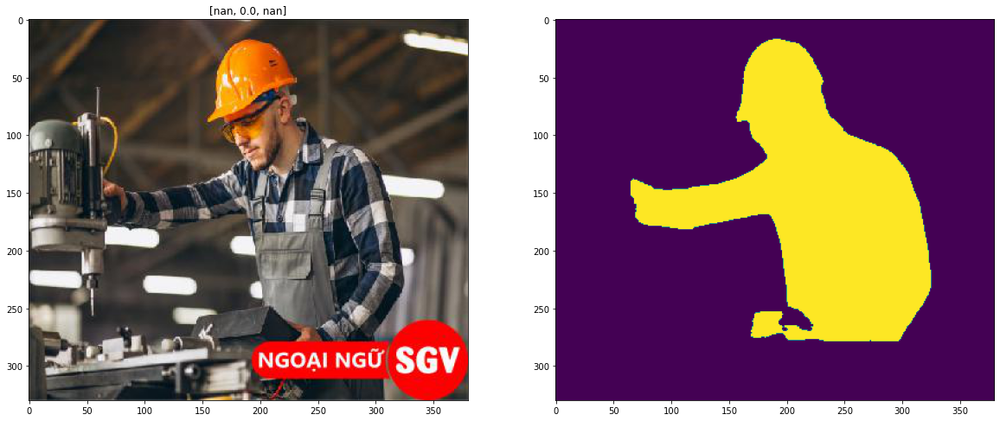

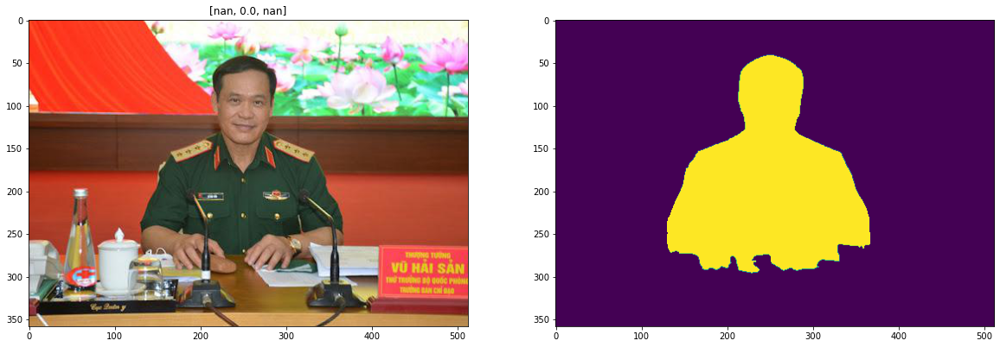

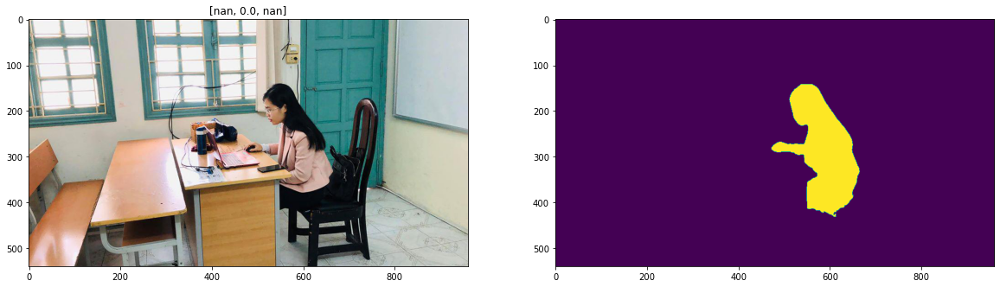

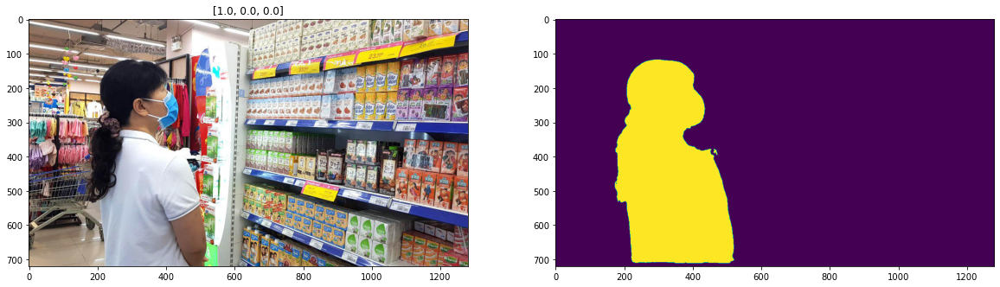

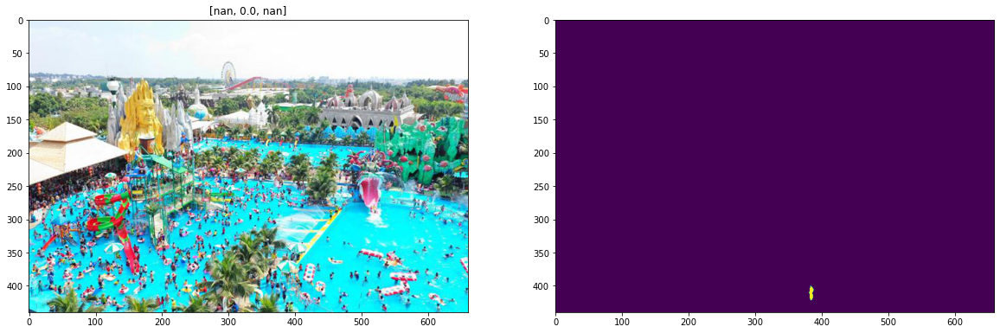

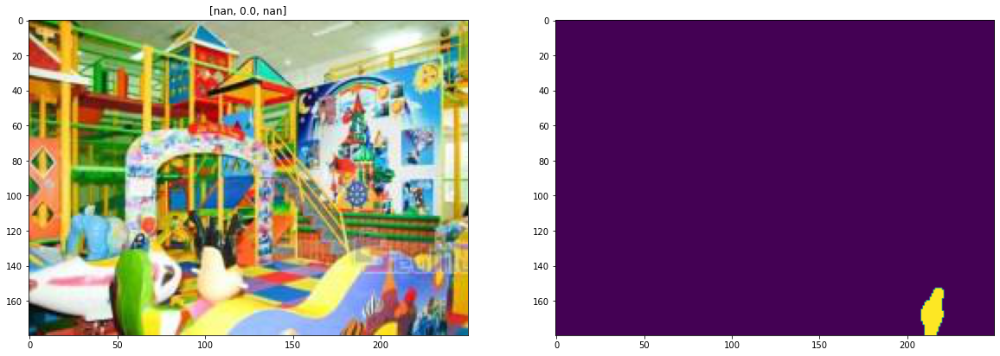

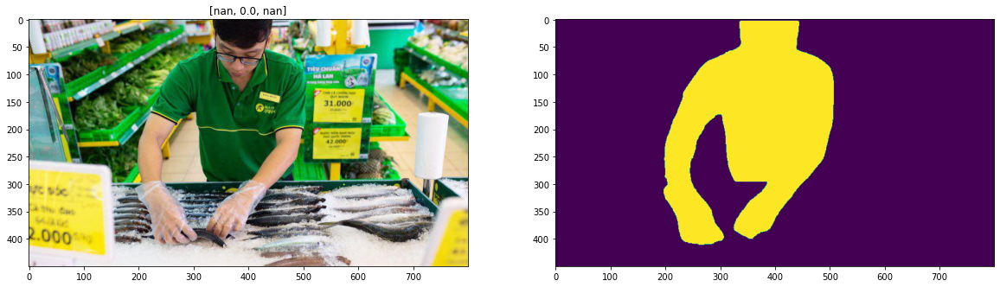

In [13]:
tmp_df = train_df[(train_df.n_people==1) & (train_df.distancing==0)]

for i in range(len(tmp_df)):
    ex = tmp_df.iloc[i]
    path = os.path.join(IM_FOLDER, ex.fname)
    read_and_show(path, ex[['mask', 'distancing', '5k']])

In [14]:
len(tmp_df)

9

### Check images with distancing=NaN but n_people ==1

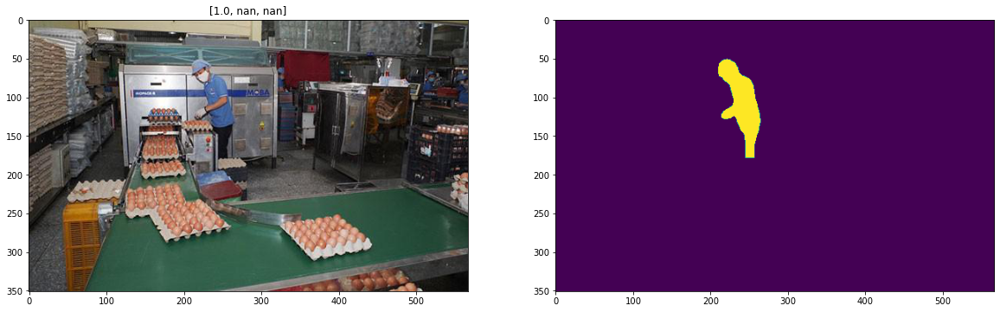

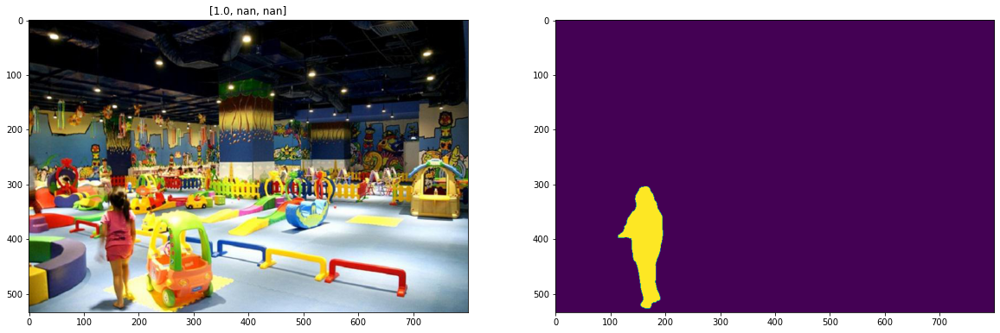

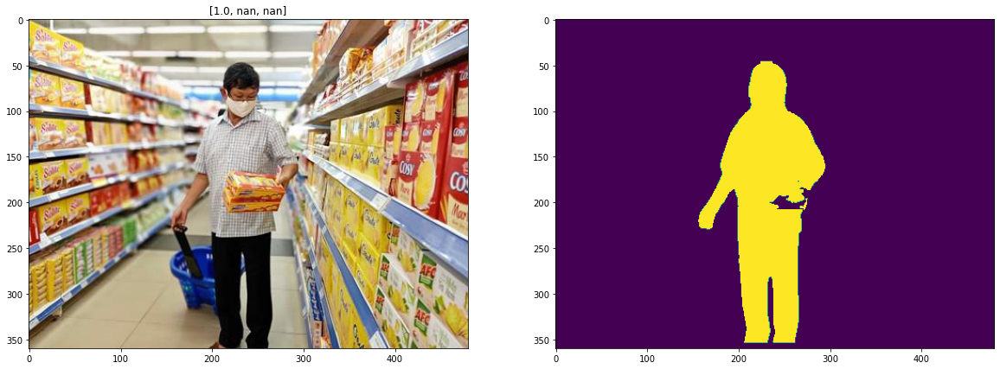

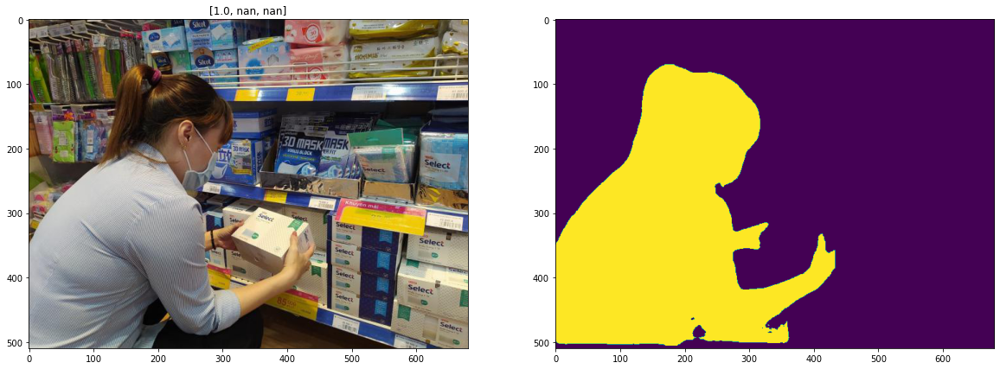

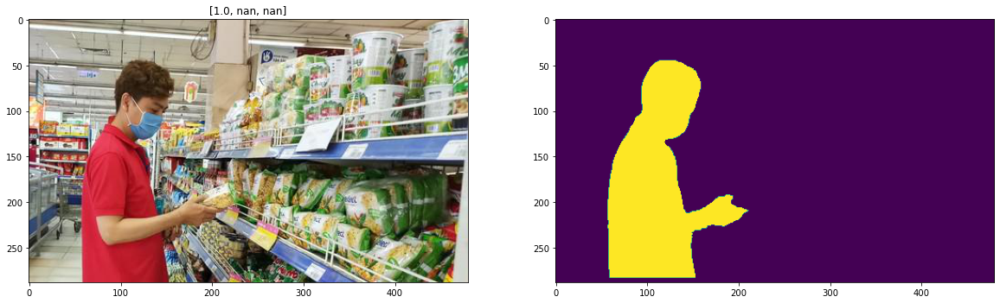

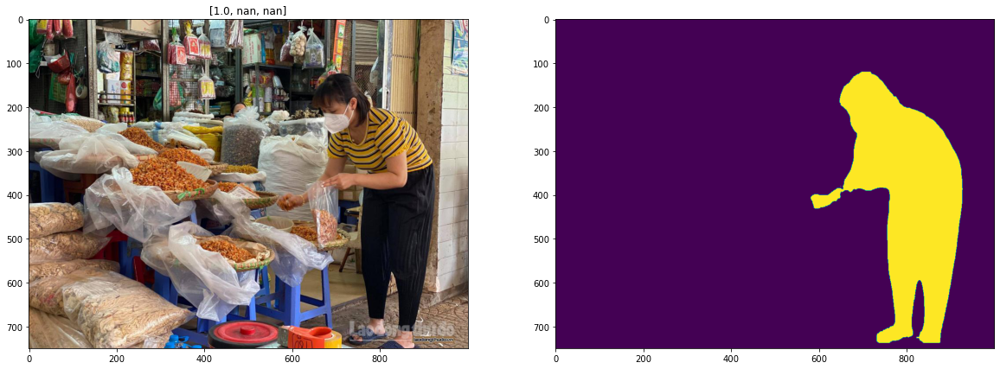

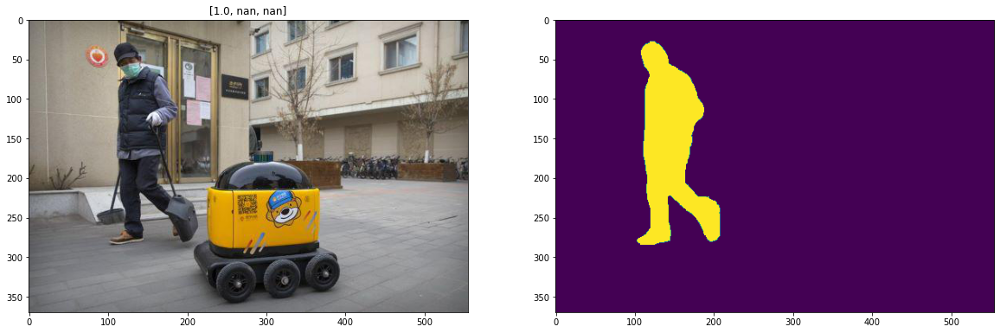

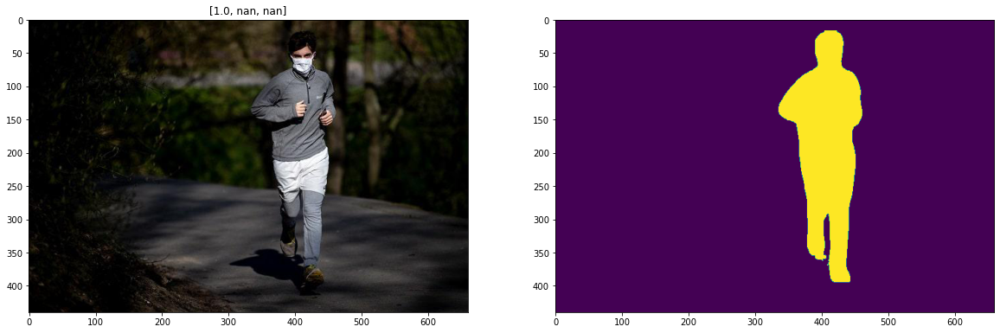

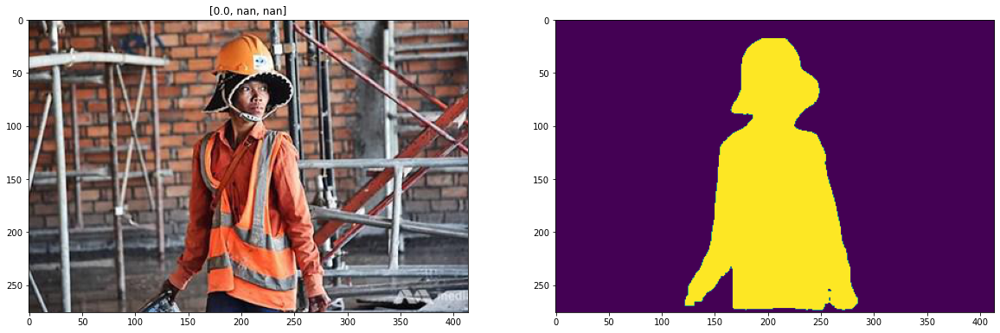

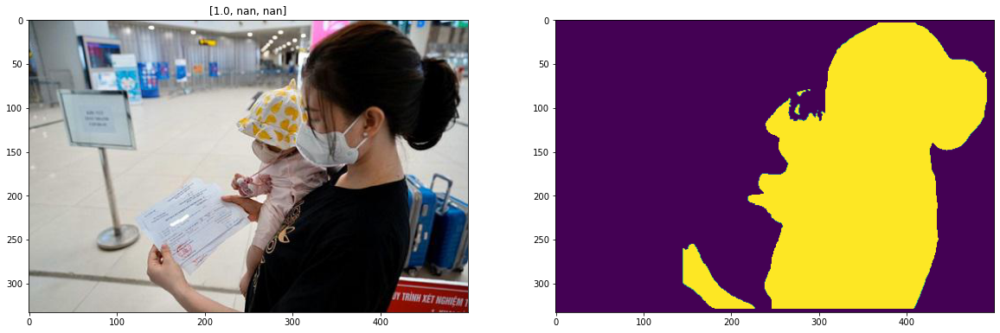

In [15]:
tmp_df = train_df[(train_df.n_people==1) & (train_df.distancing.isna())]

for i in range(10):
    ex = tmp_df.sample(1).iloc[0]
    path = os.path.join(IM_FOLDER, ex.fname)
    read_and_show(path, ex[['mask', 'distancing', '5k']])

In [16]:
len(tmp_df)

139

### Check images with n_people==0

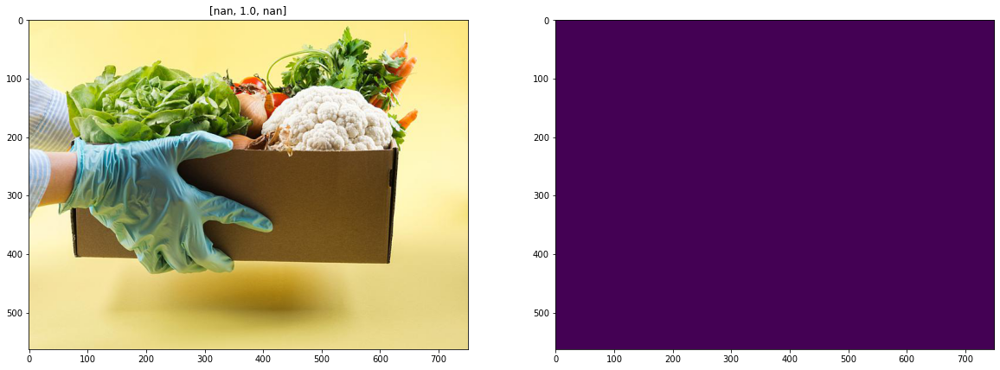

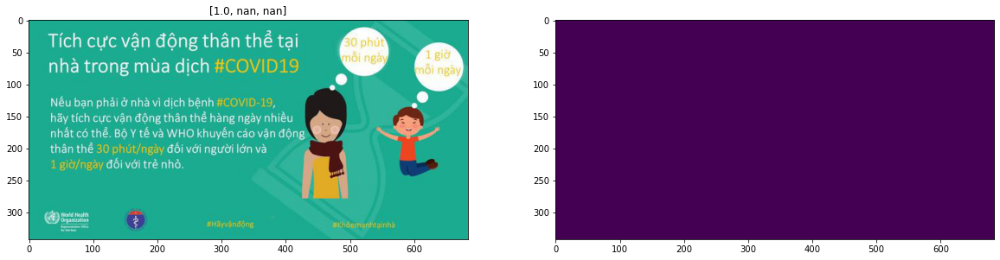

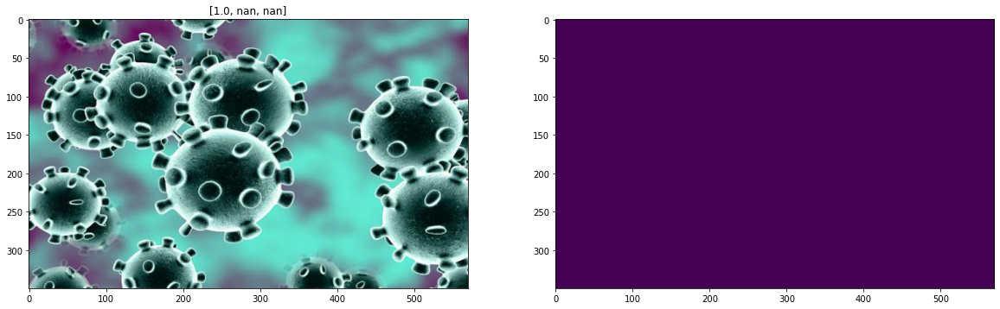

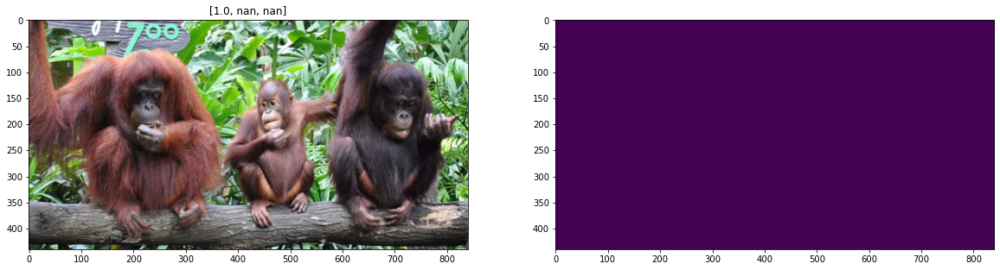

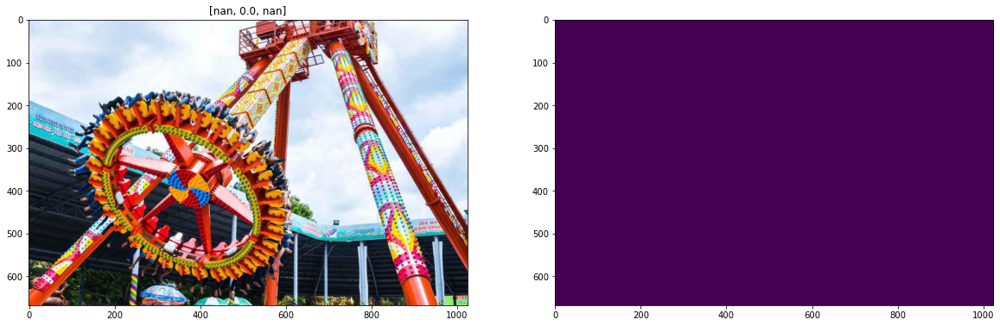

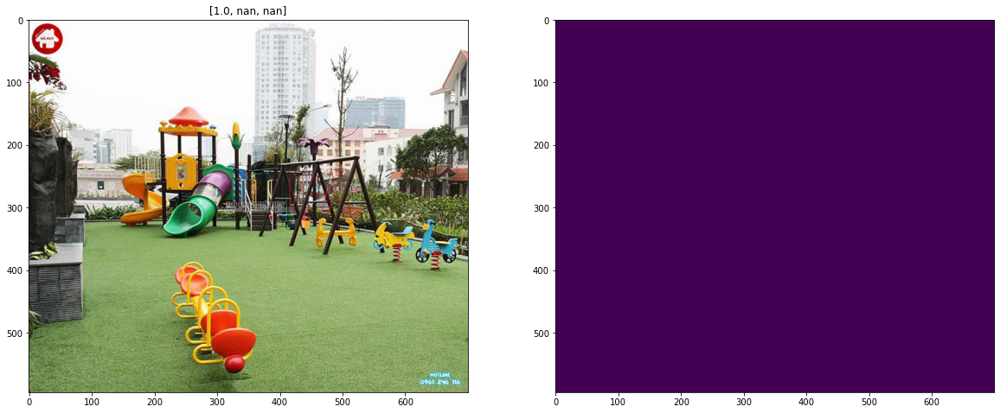

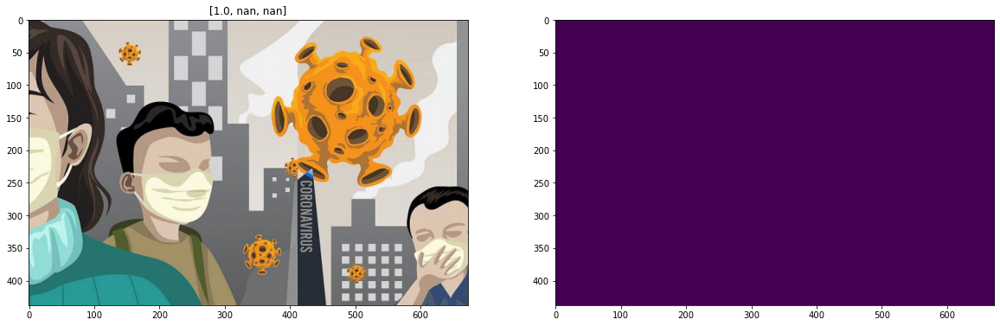

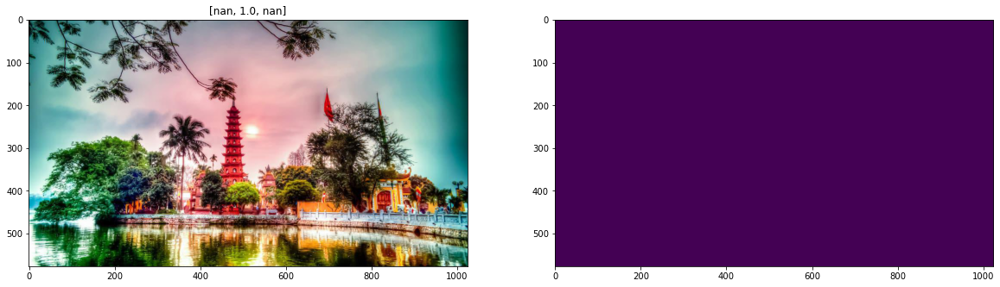

In [17]:
tmp_df = train_df[(train_df.n_people==0)]

for i in range(len(tmp_df)):
    ex = tmp_df.iloc[i]
    path = os.path.join(IM_FOLDER, ex.fname)
    read_and_show(path, ex[['mask', 'distancing', '5k']])

In [18]:
len(tmp_df)

8

## Relabel/Fillna distancing -> 1 for images with n_people <= 1

In [19]:
train_df.loc[train_df.n_people<=1, 'distancing'] = 1

In [20]:
train_df[['distancing', 'n_people']].corr()

,distancing,n_people
distancing,1.000000,-0.411464
n_people,-0.411464,1.000000


image_id          1852
fname         1852.jpg
mask               1.0
distancing         NaN
5k                 NaN
n_people           3.0
Name: 1755, dtype: object


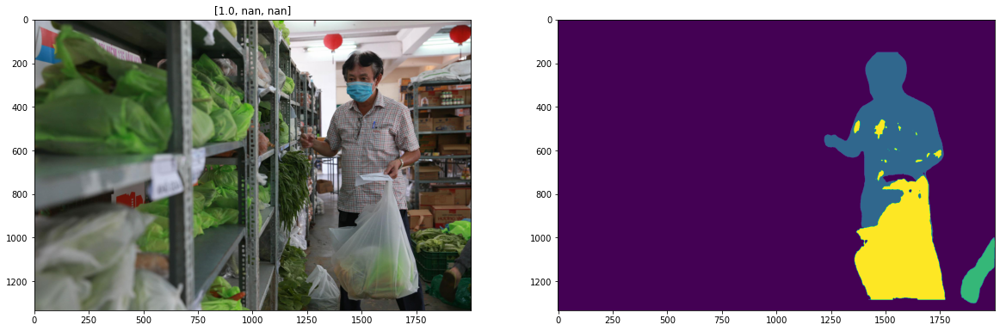

In [21]:
ex = train_df[train_df.image_id==1852].iloc[0]
print(ex)
path = os.path.join(IM_FOLDER, ex.fname)
read_and_show(path, ex[['mask', 'distancing', '5k']])

In [22]:
train_df['5k'] = train_df['mask'] * train_df['distancing']

In [23]:
# train_df.to_csv('../data/dedup_and_fill_dist_truongbn2_check.csv', index=False)

In [24]:
train_df = train_df.fillna(0)

In [29]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
from sklearn.metrics import f1_score

In [30]:
m = LogisticRegression()
# m = RandomForestClassifier()

In [31]:
cross_val_score(m, X=train_df[['n_people']], y=train_df['distancing'], cv=5,
               scoring='f1'
               )

array([0.58252427, 0.55572998, 0.58461538, 0.55660377, 0.55151515])

In [32]:
SEED=67
mskf = MultilabelStratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

i = 0
for train_index, valid_index in mskf.split(train_df['image_id'], train_df[['mask', 'distancing', '5k']]):
    train_df.loc[valid_index, 'fold'] = i
    i += 1

/Users/namnguyenthe/miniforge3/envs/env1/lib/python3.8/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=67 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [33]:
# train_df.to_csv('../train_relabel_n_people.csv', index=False)

In [34]:
def custom_cross_val_score(model, df, X_cols, y_col, fold_col='fold', thresh=0.5):
    folds = np.sort(df[fold_col].unique())
    scores = []
    for f in folds:
        m.fit(train_df.loc[train_df[fold_col]!=f, X_cols], train_df.loc[train_df[fold_col]!=f, y_col])
        pred = m.predict_proba(train_df.loc[train_df[fold_col]==f, X_cols])[:,1] >= thresh
        target = train_df.loc[train_df[fold_col]==f, y_col]
        scores.append(f1_score(target, pred))
    return scores

In [35]:
custom_cross_val_score(m, train_df, ['n_people'], 'distancing', thresh=0.3)

[0.613903743315508,
 0.6397449521785336,
 0.6324786324786325,
 0.6227027027027027,
 0.6181434599156118]

In [33]:
train_df.to_csv('../data/train_resolve_duplicates_fold_split.csv', index=False)